## 구글 드라이브 연동

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## 라이브러리

In [ ]:
!pip install keras-FaceNet

     |████████████████████████████████| 2.3MB 12.1MB/s 
  Created wheel for keras-FaceNet: filename=keras_facenet-0.3.2-cp36-none-any.whl size=10387 sha256=48459e122c2697f447851a489056eaeb52d5952a12d4c70d8ab4fdde0f979f5a
  Stored in directory: /root/.cache/pip/wheels/f6/53/9a/36c4b52fd22faf4f710d5047d874655b85a1b2cf77accfb9bd
Successfully built keras-FaceNet


In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow import keras
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2
from tensorflow.keras.applications.xception import Xception
from tensorflow.keras.layers import AveragePooling2D , Conv2D, MaxPooling2D , GlobalAveragePooling2D, BatchNormalization
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import load_model
from sklearn.preprocessing import LabelBinarizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from keras_facenet import FaceNet
#from imutils import paths
import matplotlib.pyplot as plt
import numpy as np
import argparse
import os
import cv2
import tensorflow

## 모델 가져오기

### my_model

In [ ]:
my_model = keras.models.Sequential([
    Conv2D(64,7,activation='relu',padding='same',input_shape=[224,224,3])
    ,MaxPooling2D(2)
    ,Conv2D(128,3,activation='relu',padding='same')
    ,Conv2D(128,3,activation='relu',padding='same')
    ,MaxPooling2D(2)
    ,Conv2D(256,3,activation='relu',padding='same')
    ,Conv2D(256,3,activation='relu',padding='same')
    ,MaxPooling2D(2)
    ,Flatten()
    ,Dense(128,activation='relu')
    ,Dropout(0.5)
    ,Dense(2,activation='softmax')
])



### my_res_model

In [ ]:
class ResidualUnit(keras.layers.Layer):
    def __init__(self,filters,strides=1,activation='relu',**kwargs):
        super().__init__(**kwargs)
        self.activation = keras.activations.get(activation)
        self.main_layers = [
            Conv2D(filters,3,strides=strides,padding='same',use_bias=False)
            ,BatchNormalization()
            ,self.activation
            ,Conv2D(filters,3,strides=1,padding='same',use_bias=False)
            ,BatchNormalization()
        ]
        self.skip_layers = []
        if strides > 1:
            self.skip_layers = [
                Conv2D(filters,1,strides=strides,padding='same',use_bias=False)
                ,BatchNormalization()
            ]
    
    def call(self,inputs):
        Z = inputs
        for layer in self.main_layers:
            Z = layer(Z)
        skip_Z = inputs
        for layer in self.skip_layers:
            skip_Z = layer(skip_Z)
        return self.activation(Z + skip_Z)

In [ ]:
my_res_model = keras.models.Sequential()
my_res_model.add(Conv2D(64,7,strides=2,input_shape=[224,224,3],padding='same',use_bias=False))
my_res_model.add(BatchNormalization())
my_res_model.add(keras.layers.Activation('relu'))
my_res_model.add(MaxPooling2D(pool_size=3,strides=2,padding='same'))
prev_filters = 64
for filters in [64]*3 + [128]*4 + [256]*6 + [512]*3:
    strides = 1 if filters == prev_filters else 2
    my_res_model.add(ResidualUnit(filters,strides=strides))
    prev_filters = filters
my_res_model.add(GlobalAveragePooling2D())
my_res_model.add(Flatten())
my_res_model.add(Dense(128,activation='relu'))
my_res_model.add(Dropout(0.5))
my_res_model.add(Dense(2,activation='softmax'))

### 저장된 모델

- VGG

In [ ]:
vgg_model = keras.models.load_model('/content/drive/My Drive/final_dataset/vgg16.h5')

### 전이학습 모델

- ResNet, Mobilenet, Xception
- weight 만 저장된 모델

In [ ]:
def tuning_model(base_model):
  head_model = GlobalAveragePooling2D()(base_model.output)
  head_model = Flatten(name='flatten')(head_model)
  head_model = Dense(128,activation='relu')(head_model)
  head_model = Dropout(0.5)(head_model)
  head_model = Dense(2,activation='softmax')(head_model)

  return Model(inputs=base_model.input, outputs=head_model)

In [ ]:
mobilnet_model = tuning_model(MobileNetV2(include_top=False, weights='imagenet'))
resnet_model = tuning_model(ResNet50(include_top=False, weights='imagenet'))
xecption_net = tuning_model(Xception(include_top=False, weights='imagenet'))

83689472/83683744 [==============================] - 1s 0us/step


### 모델 weight 불러오기

In [ ]:
path = '/content/drive/My Drive/checkpoint/'

my_model.load_weights(path + 'my_model-15.ckpt')
mobilnet_model.load_weights(path + 'mobile_model-15.ckpt')
resnet_model.load_weights(path + 'resnet_model-12.ckpt')
xecption_net.load_weights(path + 'xception_model-12.ckpt')
my_res_model.load_weights(path + 'my_res_model-20.ckpt')

## 이미지 TEST

In [ ]:
# 이미지를 넣어 마스크 착용 유무를 퍼센테이지로 반환하는 함수

def img_test(model,path):  
  '''
  param

  model : 사용할 모델
  path :  img 경로
  '''
  fn = FaceNet() # facedetection

  img = cv2.imread(path)
  plt.figure(figsize=(10, 6))
  plt.imshow(img[:, :, ::-1]) # BGR을 RGB로 바꿔줌 # 원본 이미지 출력

  faces = fn.crop(img)[1] # facedetection 결과 (리스트)

  plt.figure(figsize=(6, 3))

  for i, face in enumerate(faces):
      plt.subplot(1, len(faces), i+1)
      plt.imshow(face[:, :, ::-1]) # facedetection 결과 출력 (다수 가능)
  
  plt.figure(figsize=(6, 5))

  for i, face in enumerate(faces):
      # facedetection 된 결과 이미지 전처리

      face_input = cv2.resize(face, dsize=(224, 224)) 
      face_input = cv2.cvtColor(face_input, cv2.COLOR_BGR2RGB)
      face_input = preprocess_input(face_input)
      face_input = np.expand_dims(face_input, axis=0)
      
      nomask, mask = model.predict(face_input).squeeze()

      plt.subplot(1, len(faces), i+1)
      plt.imshow(face[:, :, ::-1])
      plt.title('%.2f%%' % (mask * 100)) # 결과 출력 마스크 착용 가능성(%)

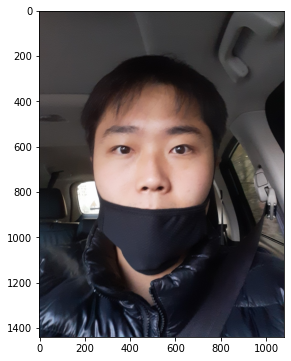

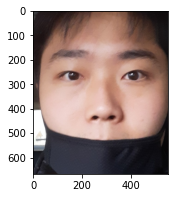

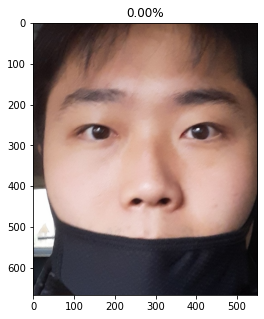

In [ ]:
path = '/content/drive/My Drive/final_dataset/test_images/나.jpg'
img_test(vgg_model,path)

## 이미지에 box 그리기

- 디택션 된 이미지에 box 그림
- 마스크 착용 유무에 따라 다른색, 표기
  - 착용:초록, 미착용: 빨강

In [ ]:
def img_box(model,path):  
  
  fn = FaceNet()
  
  img = cv2.imread(path)
  faces = fn.crop(img)
  
  face_output = img.copy()
  h, w, c = face_output.shape
  face_output = cv2.resize(face_output,dsize=(1080,int(h*1080/w)))

  for info, face in zip(faces[0],faces[1]):
    face_input = cv2.resize(face, dsize=(224, 224))
    face_input = cv2.cvtColor(face_input, cv2.COLOR_BGR2RGB)
    face_input = preprocess_input(face_input)
    face_input = np.expand_dims(face_input, axis=0)
      
    nomask, mask = model.predict(face_input).squeeze()

    if mask > nomask : # 결과에 따라 색 및 label 지정
      color = (0,255,0)
      label = 'MASK {:.1f}%'.format(mask*100)
    else :
      color = (0,0,255)
      label = 'NOMASK {:.1f}%'.format(nomask*100)

    box = info['box'] # 박스크기 지정 # 일관성을 위해 이미지 크기를 조정 (가로 기준 1080)

    x1 = int(box[0] * 1080/w)
    y1 = int(box[1]* 1080/w)
    x2 = int(x1 + box[2]* 1080/w)
    y2 = int(y1 + box[3]* 1080/w)
    
    
    cv2.rectangle(face_output, pt1=(x1, y1), pt2=(x2, y2), thickness=2, color=color, lineType=cv2.LINE_AA)
    cv2.putText(face_output, text=label, org=(x1, y1 - 10), fontFace=cv2.FONT_HERSHEY_SIMPLEX, fontScale=1.5, color=color, thickness=3, lineType=cv2.LINE_AA)

  plt.figure(figsize = (12,12))
  plt.imshow(face_output[:, :, ::-1])

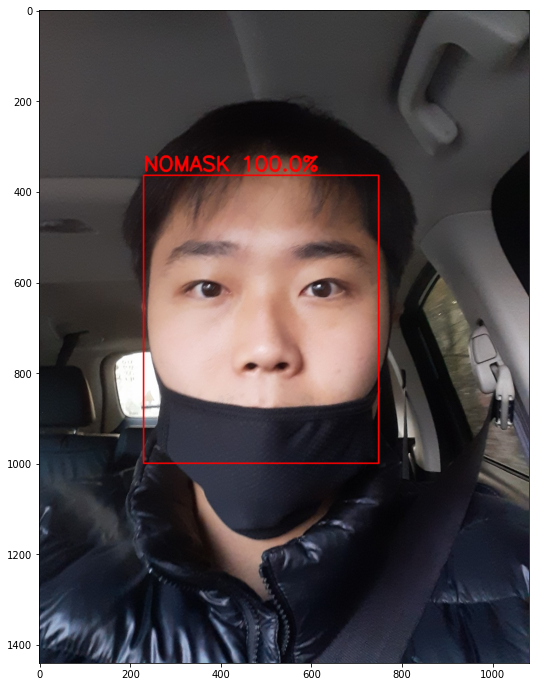

In [ ]:
img_test2(model,path)

## Feature map

- vgg 예시

In [ ]:
# model의 layer 순서 및 이름 확인하기 (conv layer)

for i in range(len(vgg_model.layers)):
  layer = vgg_model.layers[i]
  if 'conv' in layer.name:
    print(i, layer.name, layer.output.shape)

1 block1_conv1 (None, 224, 224, 64)
2 block1_conv2 (None, 224, 224, 64)
4 block2_conv1 (None, 112, 112, 128)
5 block2_conv2 (None, 112, 112, 128)
7 block3_conv1 (None, 56, 56, 256)
8 block3_conv2 (None, 56, 56, 256)
9 block3_conv3 (None, 56, 56, 256)
11 block4_conv1 (None, 28, 28, 512)
12 block4_conv2 (None, 28, 28, 512)
13 block4_conv3 (None, 28, 28, 512)
15 block5_conv1 (None, 14, 14, 512)
16 block5_conv2 (None, 14, 14, 512)
17 block5_conv3 (None, 14, 14, 512)


In [ ]:
# 모델 conv layer 결과 확인하기

def model_filter(img_path,model,layer_num):

  model = Model(inputs=model.inputs, outputs=model.layers[layer_num].output) # 모델 output을 지정한 layer 까지로 한다.

  img = load_img(img_path, target_size=(224, 224))
  img = img_to_array(img)
  img = np.expand_dims(img, axis=0)
  img = preprocess_input(img)
  feature_maps = model.predict(img)

  plt.figure(figsize=(12,12))

  for ix in range(1,65):
    ax = plt.subplot(8,8,ix)
    ax.set_xticks([])
    ax.set_yticks([])
    plt.imshow(feature_maps[0, :, :, ix-1])

  plt.show()

1번 conv 결과


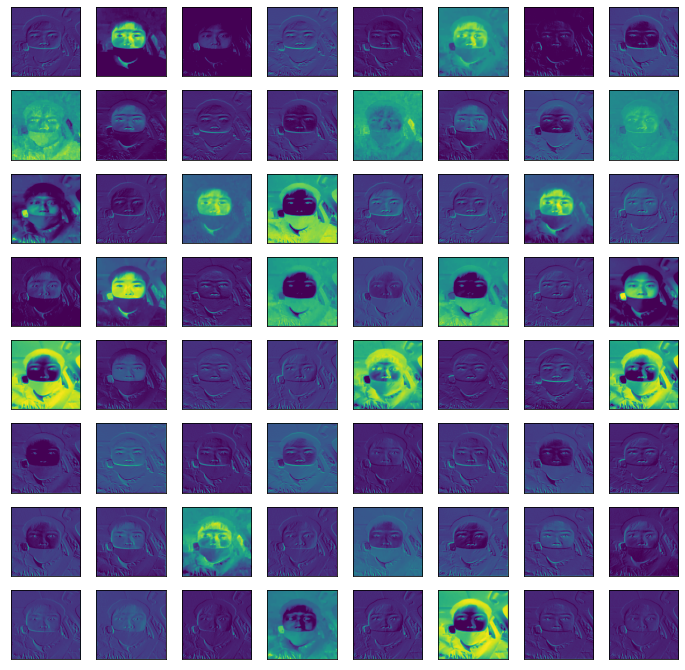

9번 conv 결과


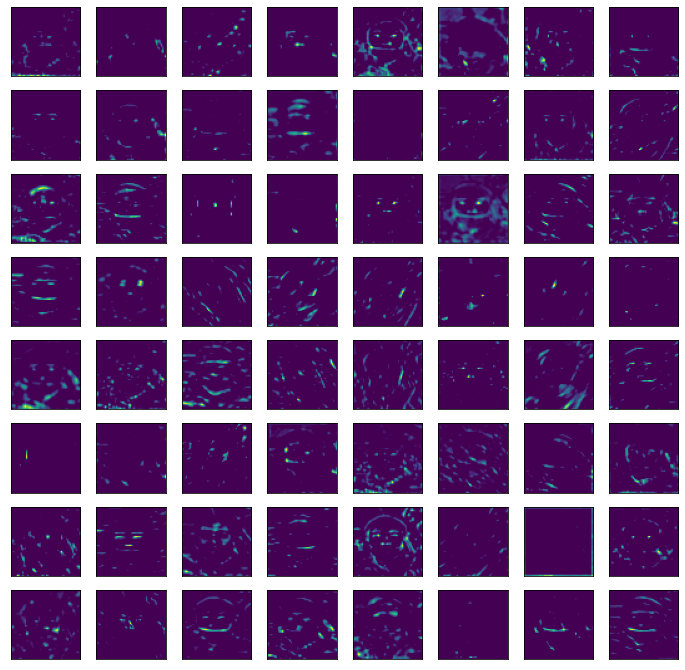

17번 conv 결과


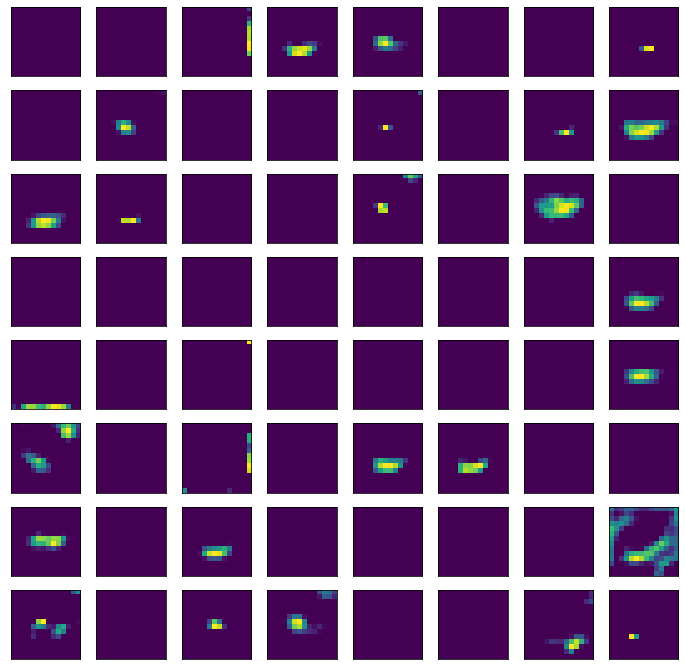

In [ ]:
path = '/content/drive/My Drive/final_dataset/test_images/나.jpg'

print('1번 conv 결과')
model_filter(path,vgg_model,layer_num=1) # 처음 conv layer
print('9번 conv 결과')
model_filter(path,vgg_model,layer_num=9) # 중간 conv layer
print('17번 conv 결과')
model_filter(path,vgg_model,layer_num=17) # 마지막 conv layer

## Grad-cam

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
from IPython.display import Image
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from tensorflow.keras import backend as K

In [ ]:
# 사용할 이미지 전처리

path = '/content/drive/My Drive/final_dataset/test_images/error_img.png'
img = cv2.imread(path)
fn = FaceNet()
face = fn.crop(img)[1][0]
face_1 = cv2.resize(face, dsize=(224, 224))
face_2 = cv2.cvtColor(face_1, cv2.COLOR_BGR2RGB)
face_3 = preprocess_input(face_2)
img = np.expand_dims(face_3, axis=0)

In [ ]:
# 모델 layer 확인 (어떤 layer도 가능하다.)
for i in range(len(model.layers)):
  layer = model.layers[i]
  if True:
    print(i, layer.name, layer.output.shape)

0 input_14 (None, 224, 224, 3)
1 block1_conv1 (None, 224, 224, 64)
2 block1_conv2 (None, 224, 224, 64)
3 block1_pool (None, 112, 112, 64)
4 block2_conv1 (None, 112, 112, 128)
5 block2_conv2 (None, 112, 112, 128)
6 block2_pool (None, 56, 56, 128)
7 block3_conv1 (None, 56, 56, 256)
8 block3_conv2 (None, 56, 56, 256)
9 block3_conv3 (None, 56, 56, 256)
10 block3_pool (None, 28, 28, 256)
11 block4_conv1 (None, 28, 28, 512)
12 block4_conv2 (None, 28, 28, 512)
13 block4_conv3 (None, 28, 28, 512)
14 block4_pool (None, 14, 14, 512)
15 block5_conv1 (None, 14, 14, 512)
16 block5_conv2 (None, 14, 14, 512)
17 block5_conv3 (None, 14, 14, 512)
18 block5_pool (None, 7, 7, 512)
19 max_pooling2d_6 (None, 1, 1, 512)
20 flatten (None, 512)
21 dense_6 (None, 128)
22 dropout_3 (None, 128)
23 dense_7 (None, 2)


In [ ]:
def generate_cam(img_tensor, model, class_index, activation_layer):
    """
    params:
    -------
    img_tensor: resnet50 모델의 이미지 전처리를 통한 image tensor
    model: pretrained resnet50 모델 (include_top=True)
    class_index: 이미지넷 정답 레이블
    activation_layer: 시각화하려는 레이어 이름

    return:
    cam: cam 히트맵
    """
    inp = model.input
    A_k = model.get_layer(activation_layer).output
    outp = model.layers[-1].output

    ## 이미지 텐서를 입력해서
    ## 해당 액티베이션 레이어의 아웃풋(a_k)과
    ## 소프트맥스 함수 인풋의 a_k에 대한 gradient를 구한다.
    get_output = K.function([inp], [A_k, outp])
    [conv_output, predictions] = get_output([img_tensor])
    
    ## 배치 사이즈가 1이므로 배치 차원을 없앤다.
    conv_output = conv_output[0]
    
    ## 마지막 소프트맥스 레이어의 웨이트 매트릭스에서
    ## 지정한 레이블에 해당하는 횡벡터만 가져온다.
    weights = model.layers[-1].get_weights()[0][:, class_index]
    
    ## 추출한 conv_output에 weight를 곱하고 합하여 cam을 얻는다.
    cam = np.zeros(dtype=np.float32, shape=conv_output.shape[0:2])
    for k, w in enumerate(weights):
        cam += w * conv_output[:, :, k]
    
    cam = cv2.resize(cam, (224, 224))
    cam = cam / cam.max()
    
    return cam

In [ ]:
path = '/content/drive/My Drive/final_dataset/test_images/error_img.png'
layername = 'block5_conv3'

def grad_cam(model,path,label=1):
  img = cv2.imread(path)
  fn = FaceNet()
  face = fn.crop(img)[1][0]
  face_1 = cv2.resize(face, dsize=(224, 224))
  face_2 = cv2.cvtColor(face_1, cv2.COLOR_BGR2RGB)
  face_3 = preprocess_input(face_2)
  img = np.expand_dims(face_3, axis=0)

  cam = generate_cam(img,model,label,'block5_conv3')

  plt.figure(figsize=(10,10))
  plt.imshow(face_1,alpha=1)
  plt.imshow(cam,alpha=0.8)

## 동영상에 적용하기

- 동영상에 box 그리고 저장


In [ ]:
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from tensorflow.keras.models import load_model
import numpy as np
import cv2
import matplotlib.pyplot as plt
import os

fn = FaceNet()
model = keras.models.load_model('/content/drive/My Drive/final_dataset/vgg16.h5')

cap = cv2.VideoCapture('/content/drive/My Drive/final_dataset/test_images/testvideo.mp4') # opencv로 영상 받아오기
ret, img = cap.read() # 동영상을 img 로 읽어옴 (img 처럼 처리 가능)


## 동영상을 저장하기
fourcc = cv2.VideoWriter_fourcc('m', 'p', '4', 'v')
out = cv2.VideoWriter('/content/drive/My Drive/final_dataset/test_images/resultvideo2.mp4', fourcc, cap.get(cv2.CAP_PROP_FPS), (img.shape[1], img.shape[0]))

while cap.isOpened(): 
    ret, img = cap.read()
    if not ret:
        break

    h, w = img.shape[:2]

    faces = fn.crop(img)

    result_img = img.copy()

    for info, face in zip(faces[0],faces[1]):
      face_input = cv2.resize(face, dsize=(224, 224))
      face_input = cv2.cvtColor(face_input, cv2.COLOR_BGR2RGB)
      face_input = preprocess_input(face_input)
      face_input = np.expand_dims(face_input, axis=0)
      nomask, mask = model.predict(face_input).squeeze()

      if mask > nomask :
        color = (0,255,0)
        label = 'MASK {:.1f}%'.format(mask*100)
      else :
        color = (0,0,255)
        label = 'NOMASK {:.1f}%'.format(nomask*100)

      box = info['box']

      x1 = int(box[0])
      y1 = int(box[1])
      x2 = int(x1 + box[2])
      y2 = int(y1 + box[3])

      cv2.rectangle(result_img, pt1=(x1, y1), pt2=(x2, y2), thickness=2, color=color, lineType=cv2.LINE_AA)
      cv2.putText(result_img, text=label, org=(x1, y1 - 10), fontFace=cv2.FONT_HERSHEY_SIMPLEX, fontScale=1, color=color, thickness=3, lineType=cv2.LINE_AA)

    out.write(result_img)
    # cv2.imshow('result', result_img)
    if cv2.waitKey(1) == ord('q'):
        break

out.release()
cap.release()

## 라이브 캠 사용

- GPU 꼭 필요 (너무 느림)
- 코랩에서 불가능(아직 방법을 못찾음)

In [ ]:
import cv2

cap = cv2.VideoCapture(0)
if cap.isOpened():
    print('width: {}, height : {}'.format(cap.get(3), cap.get(4)))
while True:
    ret, img = cap.read()
    
    if ret:

        faces = fn.crop(img)

        for info, face in zip(faces[0],faces[1]):
            face_input = cv2.resize(face, dsize=(224, 224))
            face_input = cv2.cvtColor(face_input, cv2.COLOR_BGR2RGB)
            face_input = preprocess_input(face_input)
            face_input = np.expand_dims(face_input, axis=0)
            nomask, mask = model.predict(face_input).squeeze()
            
            if mask > nomask :
              color = (0,255,0)
              label = 'MASK {:.1f}%'.format(mask*100)
            else :
              color = (0,0,255)
              label = 'NO MASK {:.1f}%'.format(nomask*100)

            box = info['box']

            x1 = box[0]
            y1 = box[1]
            x2 = x1 + box[2]
            y2 = y1 + box[3]
    
    
            cv2.rectangle(img, pt1=(x1, y1), pt2=(x2, y2), thickness=2, color=color, lineType=cv2.LINE_AA)
            cv2.putText(img, text=label, org=(x1, y1 - 10), fontFace=cv2.FONT_HERSHEY_SIMPLEX,
                        fontScale=1, color=color, thickness=3, lineType=cv2.LINE_AA)
            
            
        cv2.imshow('video', img)
        k = cv2.waitKey(1) # 특정 키
        if k > 0:
            break
    else:
        print('error')

cap.release()
cv2.destroyAllWindows()

## Test

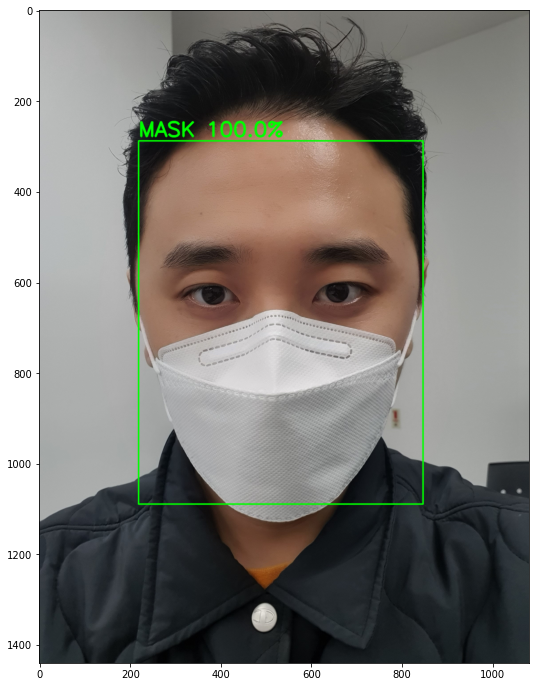

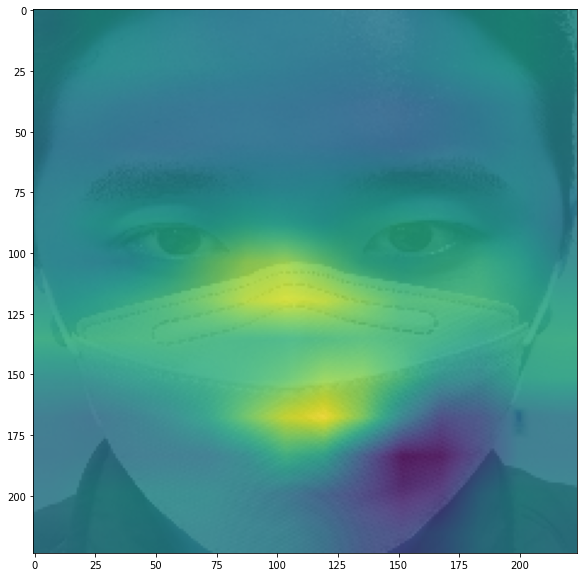

In [ ]:
path = '/content/drive/My Drive/final_dataset/test_images/t23.jpg'

img_box(model,path)
grad_cam(model,path,1)

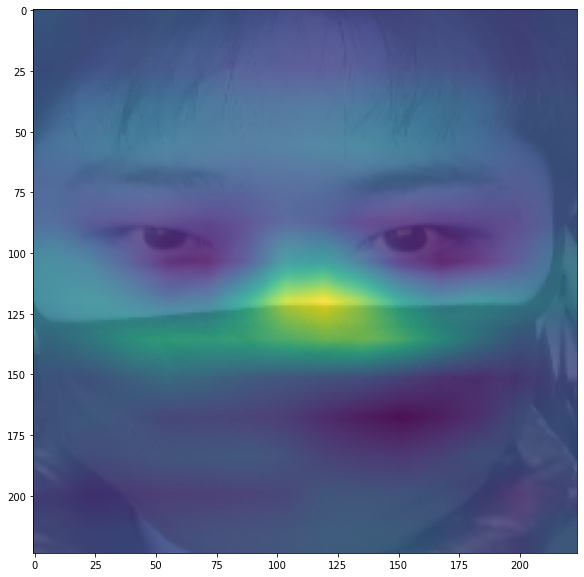

In [ ]:
grad_cam(model,path,0)

In [ ]:
path_dir = '/content/drive/My Drive/final_dataset/test_images/'
paths = [path_dir + i + '.jpg' for i in ['나','y1','t12','t11']]

for n,a in enumerate(paths):
  img_box(model,a)
  grad_cam(a,(n//2))

In [ ]:
my_model = my_res_model
my_model.load_weights('/content/drive/My Drive/checkpoint/my_res_model-3-20.ckpt')

In [ ]:
path_dir = '/content/drive/My Drive/final_dataset/test_images/'
paths = [path_dir + i + '.jpg' for i in ['나','y1','t12','t11']]

for n,a in enumerate(paths):
  img_box(my_model,a)
  grad_cam(my_model,'residual_unit_15',a,(n//2))

In [ ]:
my_model = keras.models.load_model('/content/drive/My Drive/final_dataset/YS_model_tuc.h5')

In [ ]:
for i in range(len(my_model.layers)):
  layer = my_model.layers[i]
  if True:
    print(i, layer.name, layer.output.shape)

0 conv2d_5 (None, 224, 224, 64)
1 max_pooling2d_3 (None, 112, 112, 64)
2 conv2d_6 (None, 112, 112, 128)
3 conv2d_7 (None, 112, 112, 128)
4 max_pooling2d_4 (None, 56, 56, 128)
5 conv2d_8 (None, 56, 56, 256)
6 conv2d_9 (None, 56, 56, 256)
7 max_pooling2d_5 (None, 28, 28, 256)
8 flatten_1 (None, 200704)
9 dense_2 (None, 128)
10 dropout_1 (None, 128)
11 dense_3 (None, 2)


In [ ]:
def grad_cam_my(model,path,label=1):
  img = cv2.imread(path)
  fn = FaceNet()
  face = fn.crop(img)[1][0]
  face_1 = cv2.resize(face, dsize=(224, 224))
  face_2 = cv2.cvtColor(face_1, cv2.COLOR_BGR2RGB)
  face_3 = preprocess_input(face_2)
  img = np.expand_dims(face_3, axis=0)

  cam = generate_cam(img,model,label,'conv2d_9')

  plt.figure(figsize=(10,10))
  plt.imshow(face_1,alpha=1)
  plt.imshow(cam,alpha=0.8)

In [ ]:
path_dir = '/content/drive/My Drive/final_dataset/test_images/'
paths_mask = [path_dir + i + '.jpg' for i in ['y1','t11']]
paths_nosk = [path_dir + i + '.jpg' for i in ['나','t12']]

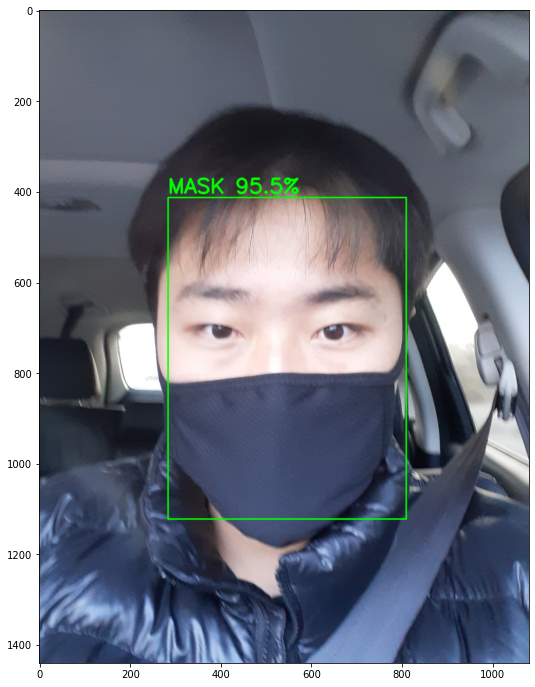

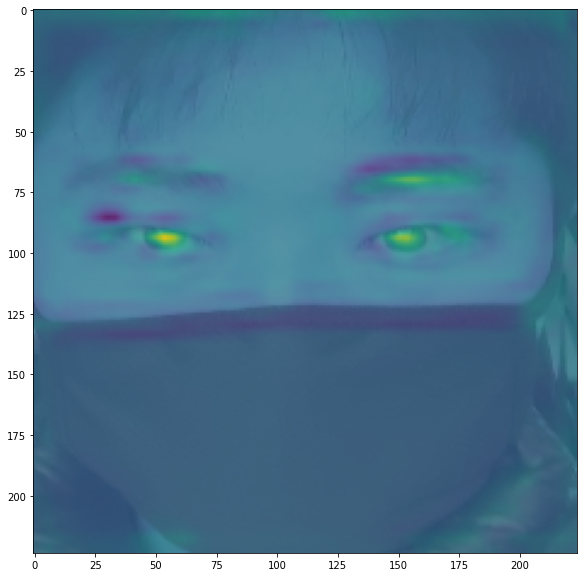

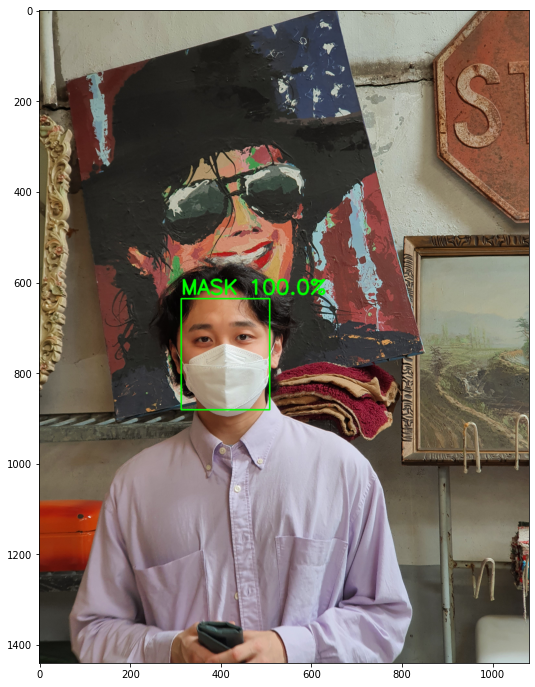

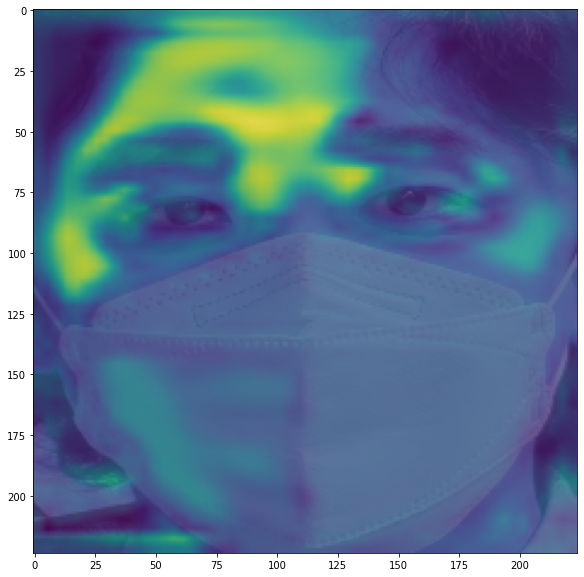

In [ ]:
for m in paths_mask:
  img_box(my_model,m)
  grad_cam_my(my_model,m,1)

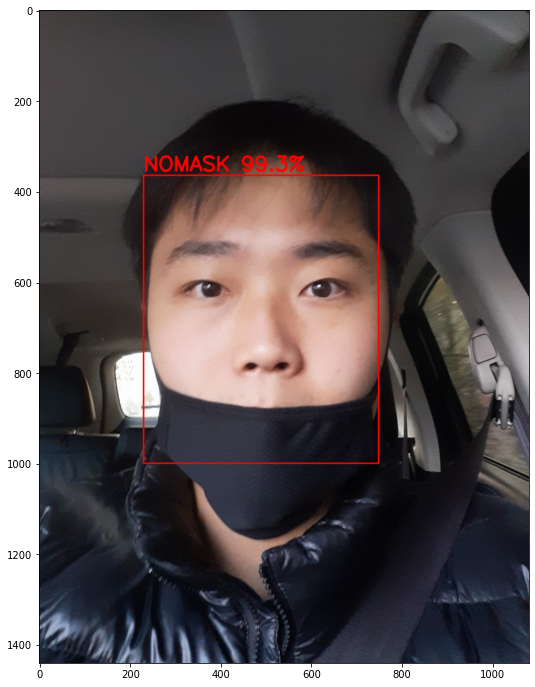

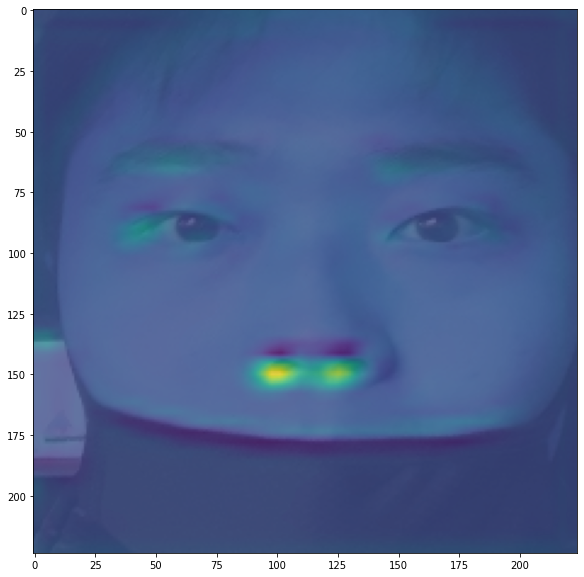

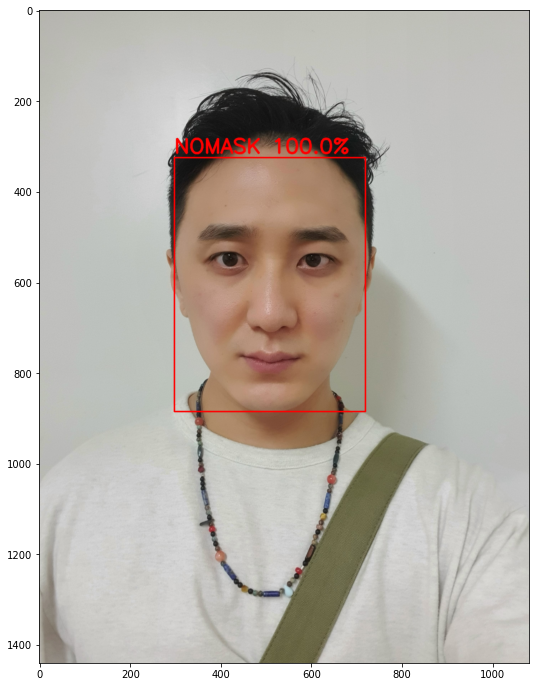

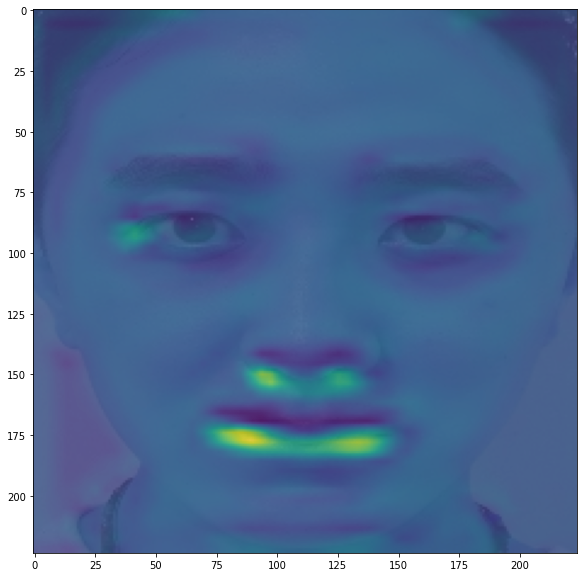

In [ ]:
for m in paths_nosk:
  img_box(my_model,m)
  grad_cam_my(my_model,m,0)

1번 conv 결과


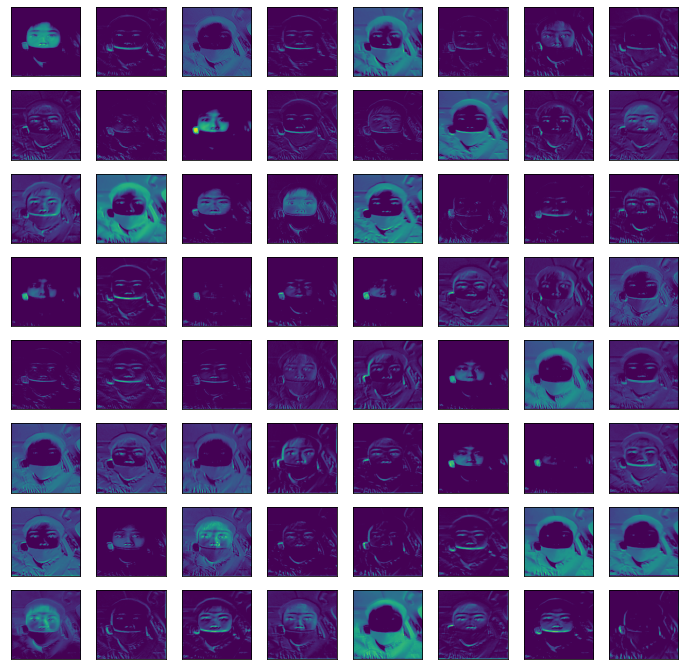

9번 conv 결과


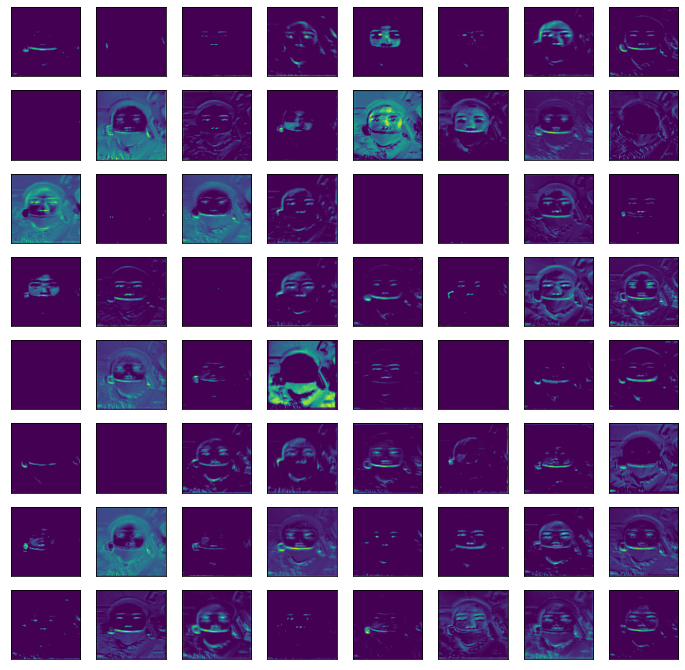

17번 conv 결과


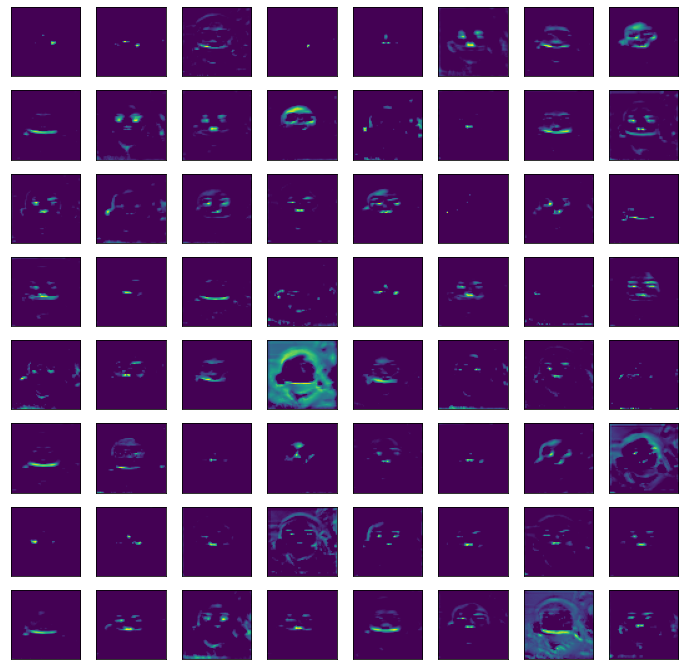

In [ ]:
path = '/content/drive/My Drive/final_dataset/test_images/나.jpg'

print('1번 conv 결과')
model_filter(path,my_model,layer_num=0) # 처음 conv layer
print('9번 conv 결과')
model_filter(path,my_model,layer_num=3) # 중간 conv layer
print('17번 conv 결과')
model_filter(path,my_model,layer_num=6) # 마지막 conv layer

In [ ]:
my_model2 = keras.models.load_model('/content/drive/My Drive/final_dataset/my_model.h5')

In [ ]:
for i in range(len(my_model2.layers)):
  layer = my_model2.layers[i]
  if True:
    print(i, layer.name, layer.output.shape)

0 conv2d_5 (None, 224, 224, 64)
1 max_pooling2d_3 (None, 112, 112, 64)
2 conv2d_6 (None, 112, 112, 128)
3 conv2d_7 (None, 112, 112, 128)
4 max_pooling2d_4 (None, 56, 56, 128)
5 conv2d_8 (None, 56, 56, 256)
6 conv2d_9 (None, 56, 56, 256)
7 max_pooling2d_5 (None, 28, 28, 256)
8 flatten_1 (None, 200704)
9 dense_2 (None, 128)
10 dropout_1 (None, 128)
11 dense_3 (None, 2)


In [ ]:
def grad_cam_my2(model,path,label=1):
  img = cv2.imread(path)
  fn = FaceNet()
  face = fn.crop(img)[1][0]
  face_1 = cv2.resize(face, dsize=(224, 224))
  face_2 = cv2.cvtColor(face_1, cv2.COLOR_BGR2RGB)
  face_3 = preprocess_input(face_2)
  img = np.expand_dims(face_3, axis=0)

  cam = generate_cam(img,model,label,'conv2d_9')

  plt.figure(figsize=(10,10))
  plt.imshow(face_1,alpha=1)
  plt.imshow(cam,alpha=0.8)

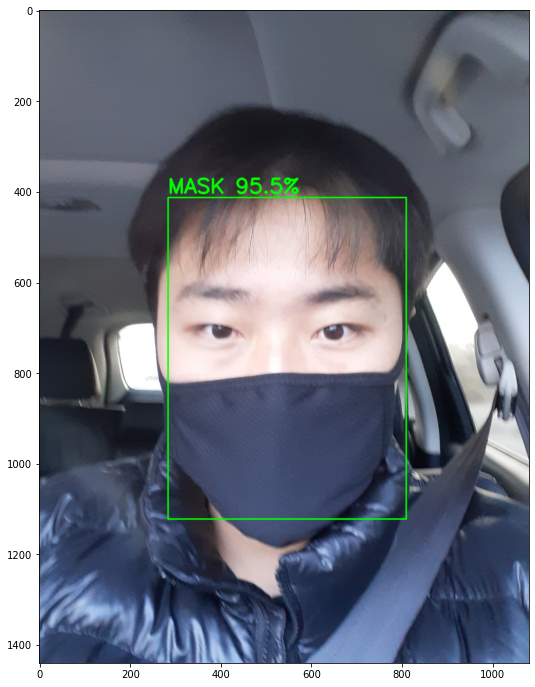

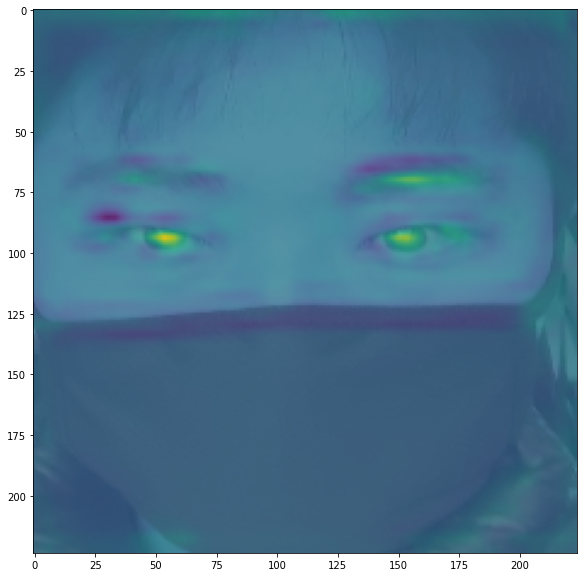

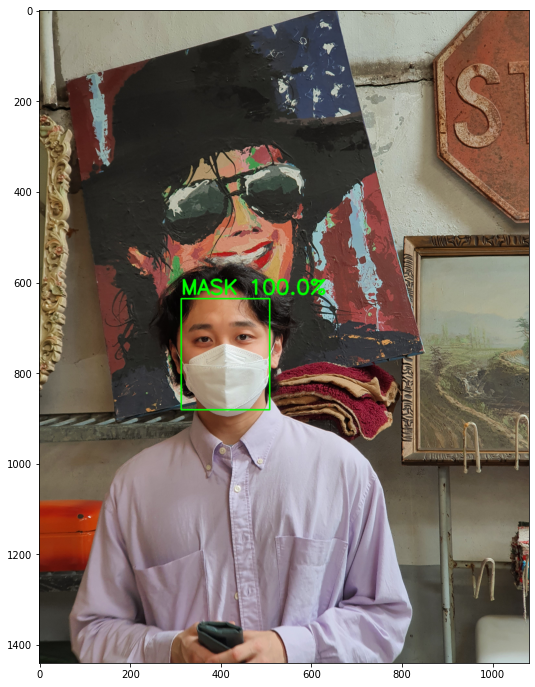

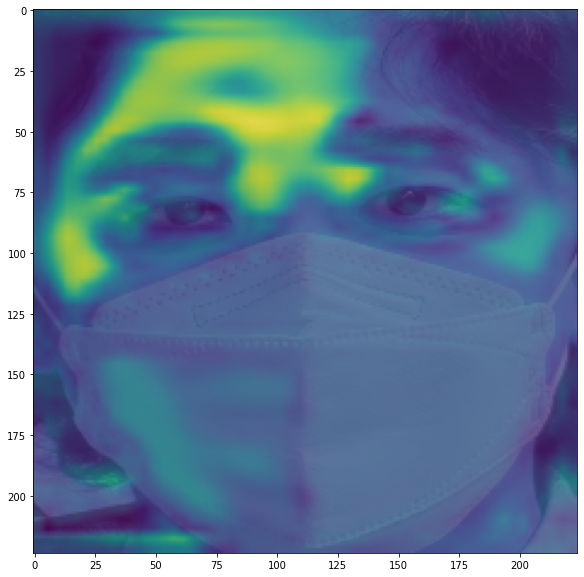

In [ ]:
for m in paths_mask:
  img_box(my_model2,m)
  grad_cam_my2(my_model2,m,1)

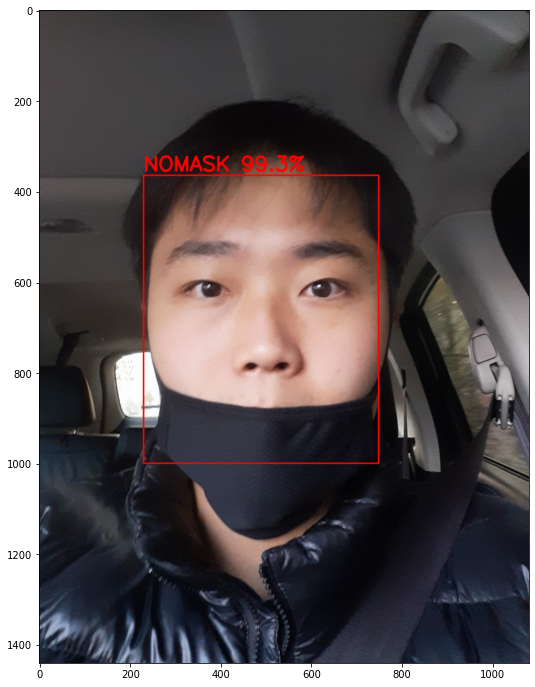

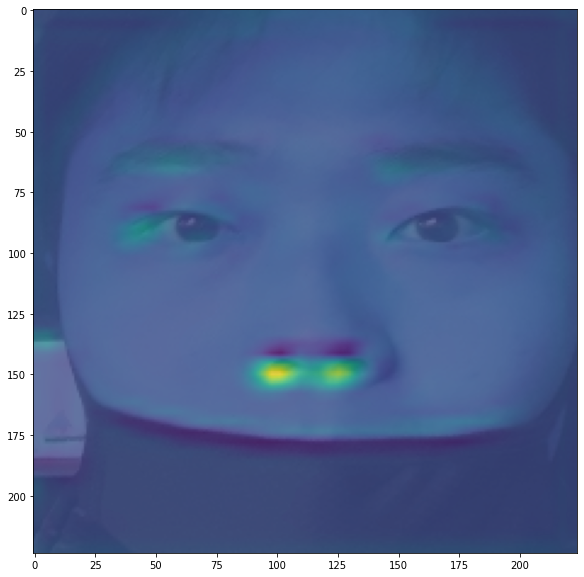

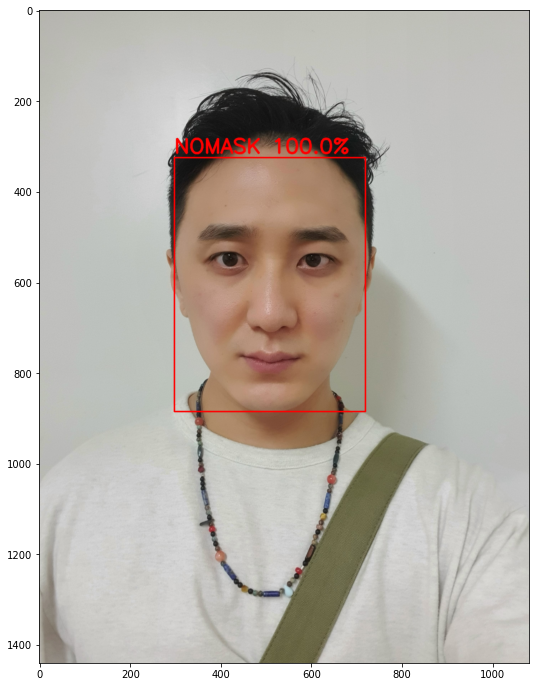

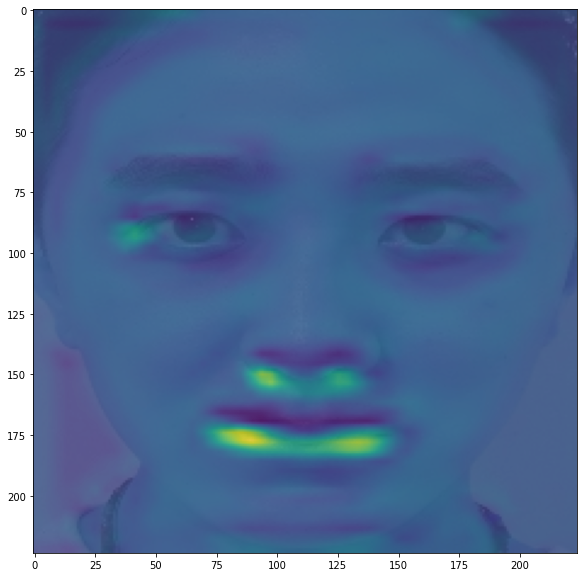

In [ ]:
for m in paths_nosk:
  img_box(my_model2,m)
  grad_cam_my2(my_model2,m,0)

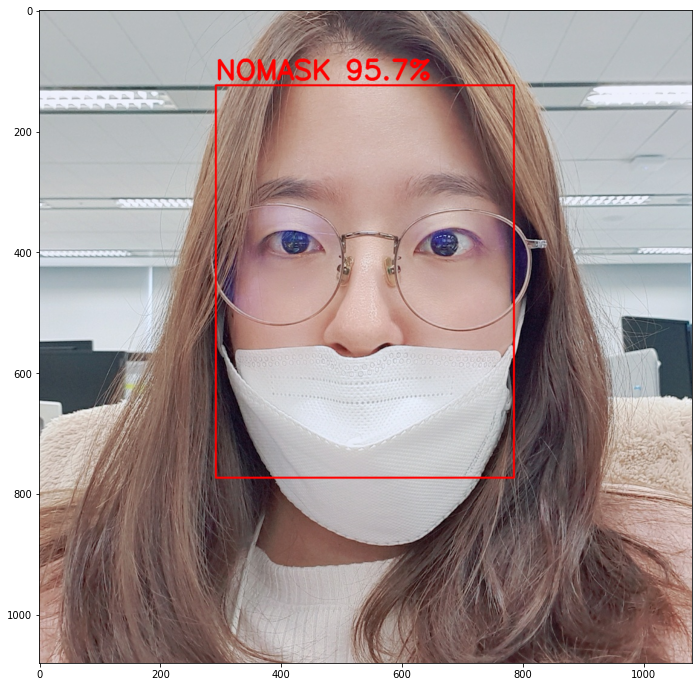

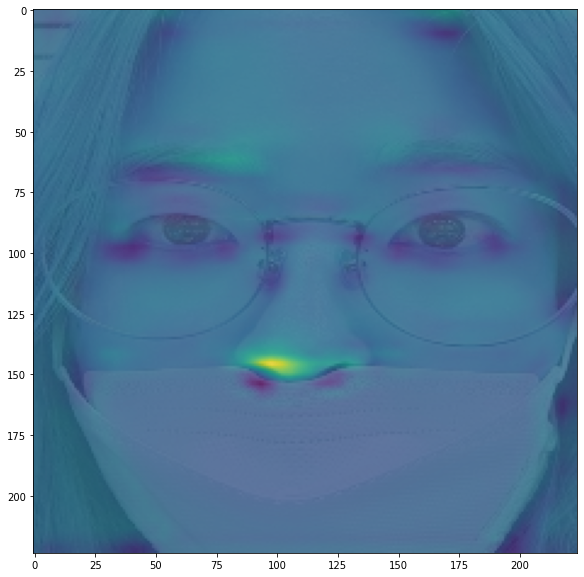

In [ ]:
m = '/content/drive/My Drive/final_dataset/test_data/song_ko.jpg'
img_box(my_model2,m)
grad_cam_my2(my_model2,m,1)

In [ ]:
model = keras.models.load_model('/content/drive/My Drive/final_dataset/my_model.h5')

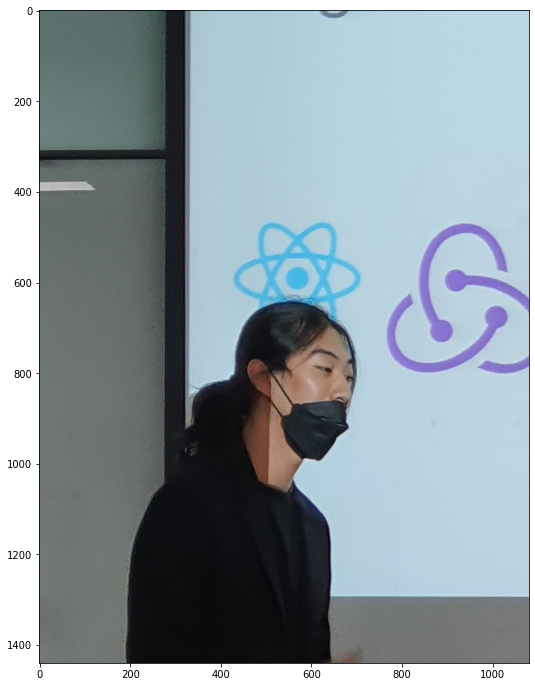

In [ ]:
path = '/content/drive/My Drive/final_dataset/test_data/세진.jpg'
img_box(model,path)